In [1]:
import os
import numpy as np
import pandas as pd
from datetime import datetime

import time
import json
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import xgboost as xgb
from sklearn.model_selection import train_test_split
import shap

shap.initjs()

In [2]:
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

In [3]:
import seaborn as sns

In [4]:
# import glob
# files = glob.glob('./Data/submissions/pennystocks/*.pickle')
# df = pd.concat([pd.read_pickle(fp) for fp in files], ignore_index=True)
# df.to_pickle('./Data/pennystocks_submissions.pickle')

In [5]:
# Load sentiment analysis package, Vader
vader = SentimentIntensityAnalyzer()

***

#### Read and select relevant columns for submissions and comments files for /r/wallstreetbets

In [6]:
wsb_submissions = pd.read_pickle('./Data/wallstreetbets_submissions.pickle')
# Identify relevant submissions columns
submissions_cols = ['title', 'author', 'created_utc', 'selftext', 'id', 'subreddit', 'subreddit_subscribers', 'score']
wsb_submissions_clean = wsb_submissions[submissions_cols]

wsb_comments = pd.read_pickle('./Data/wallstreetbets_comments.pickle')
comments_cols = ['created_utc', 'link_id', 'body', 'score', 'subreddit', 'is_submitter']
wsb_comments_clean = wsb_comments[comments_cols]

# create'id' column in wsb_comments_clean to match post id in 'wsb_submissions_clean' and drop 'link_id' column.
wsb_comments_clean['id'] = wsb_comments_clean['link_id'].apply(lambda x: str(x)[-6:])
wsb_comments_clean = wsb_comments_clean.drop(columns='link_id')

# Add a "timestamp" column with YYYY-MM-DD + time format:
wsb_submissions_clean["timestamp"] = wsb_submissions_clean.created_utc.apply(lambda x: pd.Timestamp(10 ** 9 * x, tz="US/Eastern"))
wsb_comments_clean["timestamp"] = wsb_comments_clean.created_utc.apply(lambda x: pd.Timestamp(10 ** 9 * x, tz="US/Eastern"))

# Add a "date" column with YYYY-MM-DD format:
wsb_submissions_clean["date"] = wsb_submissions_clean.created_utc.apply(lambda x: datetime.utcfromtimestamp(int(x) - 3 * 60 * 60).strftime('%Y-%m-%d'))
wsb_comments_clean["date"] = wsb_comments_clean.created_utc.apply(lambda x: datetime.utcfromtimestamp(int(x) - 3 * 60 * 60).strftime('%Y-%m-%d'))


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [7]:
wsb_submissions_clean.head()

,title,author,created_utc,selftext,id,subreddit,subreddit_subscribers,score,timestamp,date
0,Wall Street Land,Bipedal-Moose,1565880587,,cqqu8q,wallstreetbets,624144,13557,2019-08-15 10:49:47-04:00,2019-08-15
1,Never go full Anal Farmer,haupt91,1565890620,,cqt4jl,wallstreetbets,624305,7389,2019-08-15 13:37:00-04:00,2019-08-15
2,Spy back up .58%,f0xl-lound,1565870531,"That means the recession is over! Phew, what a...",cqovga,wallstreetbets,623981,1451,2019-08-15 08:02:11-04:00,2019-08-15
3,When we see those Chinese Tariffs rolling in,Ganghis_Can,1565889254,,cqstd4,wallstreetbets,624275,1267,2019-08-15 13:14:14-04:00,2019-08-15
4,Buy Greenland?,MU_Bagholder,1565918134,Do you really think mango was trying to buy an...,cqz76f,wallstreetbets,625091,995,2019-08-15 21:15:34-04:00,2019-08-15


In [8]:
wsb_comments_clean.head()

,created_utc,body,score,subreddit,is_submitter,id,timestamp,date
0,1573881670,"Couldn't breathe, couldn't speak",1,wallstreetbets,False,cqqu8q,2019-11-16 00:21:10-05:00,2019-11-16
1,1566915272,I read socks lmao,1,wallstreetbets,False,cqqu8q,2019-08-27 10:14:32-04:00,2019-08-27
2,1566080830,What’s the movie/ show?,1,wallstreetbets,False,cqqu8q,2019-08-17 18:27:10-04:00,2019-08-17
3,1566011343,Aristocrats!,1,wallstreetbets,False,cqqu8q,2019-08-16 23:09:03-04:00,2019-08-17
4,1566000937,Whatcha gonna name it sailor?,1,wallstreetbets,False,cqqu8q,2019-08-16 20:15:37-04:00,2019-08-16


#### Plot of number of reddit users subscribed to /r/wallstreetbets over the period 08-15-2019 to 08-15-2020.

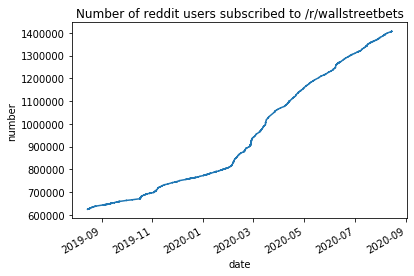

In [9]:
plt.figure()
plt.plot([x.to_pydatetime() for x in wsb_submissions_clean['timestamp']], wsb_submissions_clean['subreddit_subscribers'])
plt.gcf().autofmt_xdate()
plt.title('Number of reddit users subscribed to /r/wallstreetbets')
plt.xlabel('date')
plt.ylabel('number')
plt.show()

#### Sentiment analysis on both submissions and comments

In [10]:
# Applying the sentiment analysis to 'title' column of submissions df
wsb_title_scores = wsb_submissions_clean['title'].astype(str).apply(vader.polarity_scores).tolist()
wsb_title_scores = pd.DataFrame(wsb_title_scores)
wsb_title_scores = wsb_title_scores.add_prefix('title_')

# Merging our headline dataframe with our title sentiment scores dataframe
wsb_submissions_clean = wsb_submissions_clean.join(wsb_title_scores, rsuffix='_right')

In [11]:
# Applying sentiment analysis to 'body' column of submissions df
wsb_body_scores = wsb_submissions_clean['selftext'].astype(str).apply(vader.polarity_scores).tolist()
wsb_body_scores = pd.DataFrame(wsb_body_scores)
wsb_body_scores = wsb_body_scores.add_prefix('body_')

# Merging our headline dataframe with our body sentiment scores dataframe
wsb_submissions_clean = wsb_submissions_clean.join(wsb_body_scores, rsuffix='_right')

In [12]:
# Applying the sentiment analysis to 'body' column of comments df
wsb_comments_scores = wsb_comments_clean['body'].astype(str).apply(vader.polarity_scores).tolist()
wsb_comments_scores = pd.DataFrame(wsb_comments_scores)
wsb_comments_scores = wsb_comments_scores.add_prefix('comments_')

# Merging our headline dataframe with our comments sentiment scores dataframe
wsb_comments_clean = wsb_comments_clean.join(wsb_comments_scores, rsuffix='_right')

In [13]:
wsb_submissions_clean.head()

,title,author,created_utc,selftext,id,subreddit,subreddit_subscribers,score,timestamp,date,title_neg,title_neu,title_pos,title_compound,body_neg,body_neu,body_pos,body_compound
0,Wall Street Land,Bipedal-Moose,1565880587,,cqqu8q,wallstreetbets,624144,13557,2019-08-15 10:49:47-04:00,2019-08-15,0.0,1.0,0.0,0.0,0.000,0.000,0.000,0.0000
1,Never go full Anal Farmer,haupt91,1565890620,,cqt4jl,wallstreetbets,624305,7389,2019-08-15 13:37:00-04:00,2019-08-15,0.0,1.0,0.0,0.0,0.000,0.000,0.000,0.0000
2,Spy back up .58%,f0xl-lound,1565870531,"That means the recession is over! Phew, what a...",cqovga,wallstreetbets,623981,1451,2019-08-15 08:02:11-04:00,2019-08-15,0.0,1.0,0.0,0.0,0.133,0.533,0.333,0.8748
3,When we see those Chinese Tariffs rolling in,Ganghis_Can,1565889254,,cqstd4,wallstreetbets,624275,1267,2019-08-15 13:14:14-04:00,2019-08-15,0.0,1.0,0.0,0.0,0.000,0.000,0.000,0.0000
4,Buy Greenland?,MU_Bagholder,1565918134,Do you really think mango was trying to buy an...,cqz76f,wallstreetbets,625091,995,2019-08-15 21:15:34-04:00,2019-08-15,0.0,1.0,0.0,0.0,0.088,0.866,0.046,-0.7236


In [14]:
wsb_comments_clean.head()

,created_utc,body,score,subreddit,is_submitter,id,timestamp,date,comments_neg,comments_neu,comments_pos,comments_compound
0,1573881670,"Couldn't breathe, couldn't speak",1,wallstreetbets,False,cqqu8q,2019-11-16 00:21:10-05:00,2019-11-16,0.0,1.000,0.000,0.0000
1,1566915272,I read socks lmao,1,wallstreetbets,False,cqqu8q,2019-08-27 10:14:32-04:00,2019-08-27,0.0,0.339,0.661,0.5994
2,1566080830,What’s the movie/ show?,1,wallstreetbets,False,cqqu8q,2019-08-17 18:27:10-04:00,2019-08-17,0.0,1.000,0.000,0.0000
3,1566011343,Aristocrats!,1,wallstreetbets,False,cqqu8q,2019-08-16 23:09:03-04:00,2019-08-17,0.0,1.000,0.000,0.0000
4,1566000937,Whatcha gonna name it sailor?,1,wallstreetbets,False,cqqu8q,2019-08-16 20:15:37-04:00,2019-08-16,0.0,1.000,0.000,0.0000


***

### Exploring specific companies

In [15]:
# 30 most popular stocks on Robinhood plus Shapchat, Tesla, Apple, AMD and Netflix.
ticker_dict = {
    "TSLA": ["tsla", "tesla", "elon", "musk", "electric vehicle", "model 3", "model x", "model y", "model s"],
    "MSFT": ["msft", "microsoft", "bill gates", "gates", "windows"],
    "BABA": ["ali baba", "alibaba", "jack ma"],
    "GOOGL": ["google", "googl", "search engine"],
    "NFLX": ["nflx", "netflix", "streaming"],
    "AMZN": ["amzn", "amazon", "bezos"],
    "FB": ["fb", "facebook", "zuckerberg"],
    "UBER": ["uber", "ride sharing"],
    "NVDA": ["nvda", "nvidia"],
    "AMD": ["amd", "lisa su"],
    "SNAP": ["snap", "snapchat"],
    "APHA": ["apha", "aphria"], #cannibis
    "CPRX": ["cprx", "catalyst pharmaceuticals"], #pharma
    "DIS": ["dis", "disney", "walt disney"], 
    "DKNG": ["dkng", "draftkings"], 
    "ET": ["et", "energy transfer"],
    "GE": ["ge", "general electric"], 
    "GM": ["gm", "general motors"],
    "JNJ": ["jnj", "j&j", "Johnson & Johnson"], 
    "JPM": ["jpm", "jpmorgan", "jpmorgan chase"], 
    "KO": ["ko", "coca-cola", "coca cola"], 
    "MRNA": ["mrna", "moderna"], #pharma
    "NKE": ["nke", "nike"],
    "NRZ": ["new residential investment", "nrz"], 
    "NTDOY": ["ntdoy", "nintendo"], #games
    "PENN": ["penn", "penn national gaming"], #games
    "PLUG": ["plug", "plug power"], #hydrogen
    "PTON": ["pton", "peloton"], 
    "PYPL":["paypal", "pypl"], 
    "SNE": ["sne", "sony"], 
    "TXMD": ["txmd", "therapeutic md"], #pharma - womens
    "V": ["v", "visa", "visa inc"], 
    "WMT": ["wmt", "walmart"], 
    "ZNGA": ["znga", "zynga"] #games
}

***

In [16]:
def filter_by_keyword(df, keywords):
    return df[
        df.title.str.lower().str.contains("|".join(keywords))
        | df.selftext.str.lower().str.contains("|".join(keywords))
    ]

In [17]:
popularity = pd.read_csv(f"data/robintrack-popularity-history/tmp/popularity_export/TSLA.csv", index_col=0)
popularity.index = popularity.index.map(pd.Timestamp)
popularity["date"] = popularity.index.map(lambda x: x.date())
popularity = popularity.drop_duplicates(subset=["date"], keep="last")
popularity["log_change"] = np.log(popularity.users_holding).diff()
popularity

,users_holding,date,log_change
timestamp,,,
2018-05-02 06:38:31,81038,2018-05-02,NaN
2018-05-03 23:42:40,83646,2018-05-03,0.031675
2018-05-04 23:42:42,83240,2018-05-04,-0.004866
2018-05-05 23:42:41,83237,2018-05-05,-0.000036
2018-05-06 23:42:42,83237,2018-05-06,0.000000
...,...,...,...
2020-08-09 23:45:45,540766,2020-08-09,0.000000
2020-08-10 23:45:32,542123,2020-08-10,0.002506
2020-08-11 23:45:44,543948,2020-08-11,0.003361


In [108]:
# Change this to vary time window

In [18]:
def get_bin_label(ts):
    ## every week
    # ts.week()
    ## every 3 days
    # (ts - pd.Timestamp("20000101")).days // 3
    # every day
    return ts.date()

In [50]:
def get_popularity(stock_ticker, fdir="data/robintrack-popularity-history/tmp/popularity_export"):
    popularity = pd.read_csv(f"{fdir}/{stock_ticker}.csv", index_col=0)
    popularity.index = popularity.index.map(pd.Timestamp)
    # every day
    popularity["bin_label"] = popularity.index.map(get_bin_label)
    popularity = popularity.groupby("bin_label").mean()
    popularity["log_change"] = np.log(popularity.users_holding).diff()
    return popularity

In [28]:
def make_X_Y(popularity, submissions, comments):
    Y = popularity.users_holding
    X = pd.DataFrame(index=popularity.index) 

    submissions["bin_label"] = submissions.timestamp.apply(get_bin_label)
    comments["bin_label"] = comments.timestamp.apply(get_bin_label)

    X["num_posts"] = submissions.groupby("bin_label").title.count()
    X.loc[X.num_posts.isna(), "num_posts"] = 0
    
    X["num_comments"] = comments.groupby("bin_label").body.count()
    X.loc[X.num_comments.isna(), "num_comments"] = 0

    X["mean_post_title_sentiment"] = submissions.groupby("bin_label").title_compound.mean()
    X.loc[X.mean_post_title_sentiment.isna(), "mean_post_title_sentiment"] = 0
    
    X["mean_post_body_sentiment"] = submissions.groupby("bin_label").body_compound.mean()
    X.loc[X.mean_post_body_sentiment.isna(), "mean_post_body_sentiment"] = 0
    
    X["mean_comments_sentiment"] = comments.groupby(["bin_label"]).comments_compound.mean()
    X.loc[X.mean_comments_sentiment.isna(), "mean_comments_sentiment"] = 0

    X["num_up_votes"] = submissions.groupby("bin_label").score.sum()
    X.loc[X.num_up_votes.isna(), "num_up_votes"] = 0

    X["vote_weighted_post_title_sentiment"] = submissions.groupby("bin_label").apply(lambda x: np.sum(x.score * x.title_compound) / np.sum(x.score))
    X.loc[X.vote_weighted_post_title_sentiment.isna(), "vote_weighted_post_title_sentiment"] = 0
    
    X["vote_weighted_post_body_sentiment"] = submissions.groupby(["bin_label"]).apply(lambda x: np.sum(x.score * x.body_compound) / np.sum(x.score))
    X.loc[X.vote_weighted_post_body_sentiment.isna(), "vote_weighted_post_body_sentiment"] = 0
    
    X["vote_weighted_comments_sentiment"] = comments.groupby(["bin_label"]).apply(lambda x: np.sum(x.score * x.comments_compound) / np.sum(x.score))
    X.loc[X.vote_weighted_comments_sentiment.isna(), "vote_weighted_comments_sentiment"] = 0
    
    return X, Y

In [135]:
X = []
Y = []
for ticker, keywords in ticker_dict.items():
    pop = get_popularity(ticker)
    sub = filter_by_keyword(wsb_submissions_clean, keywords)
    com = wsb_comments_clean[wsb_comments_clean.id.isin(sub.id)]
    if len(sub) == 0 or len(com) == 0:
        continue
    X_some, Y_some = make_X_Y(pop, sub, com)
    X.append(X_some)
    Y.append(Y_some)
X = pd.concat(X, axis=0).astype(float)
Y = pd.concat(Y, axis=0).astype(float)
mask = np.any(X.isna(), axis=1).values
mask |= Y.isna().values
X = X.loc[~mask]
Y = Y.loc[~mask]
X.shape, Y.shape


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
invalid value encountered in double_scalars


((24080, 9), (24080,))

In [30]:
# This df also includes the days (from RH data) for which we do not have the reddit data. 
X.head()

,num_posts,num_comments,mean_post_title_sentiment,mean_post_body_sentiment,mean_comments_sentiment,num_up_votes,vote_weighted_post_title_sentiment,vote_weighted_post_body_sentiment,vote_weighted_comments_sentiment
bin_label,,,,,,,,,
2018-05-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-05-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-05-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-05-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-05-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [136]:
# Filter out days with no posts 

mask = ~np.all(X == 0, axis=1).values
X_nonzero = X[mask]
Y_nonzero = Y[mask]

In [32]:
print(X_nonzero.shape)
print(Y_nonzero.shape)

(4964, 9)
(4964,)


In [33]:
X_nonzero.head()

,num_posts,num_comments,mean_post_title_sentiment,mean_post_body_sentiment,mean_comments_sentiment,num_up_votes,vote_weighted_post_title_sentiment,vote_weighted_post_body_sentiment,vote_weighted_comments_sentiment
bin_label,,,,,,,,,
2019-08-16,1.0,0.0,0.34000,0.94260,0.000000,720.0,0.340000,0.942600,0.000000
2019-08-17,2.0,19.0,-0.44375,0.14435,0.005889,335.0,-0.587388,-0.317038,0.005889
2019-08-18,1.0,47.0,0.00000,0.49390,-0.041421,19.0,0.000000,0.493900,-0.041421
2019-08-19,0.0,12.0,0.00000,0.00000,0.388683,0.0,0.000000,0.000000,0.388683
2019-08-20,1.0,30.0,0.00000,0.97830,0.059980,86.0,0.000000,0.978300,0.059980


In [132]:
Y_nonzero

bin_label
2019-08-16    162989.478261
2019-08-17    163109.000000
2019-08-18    163109.000000
2019-08-19    163027.416667
2019-08-20    162695.583333
                  ...      
2020-04-29    172119.000000
2020-07-20    216699.116667
2020-07-21    217492.000000
2020-07-22    218087.666667
2020-08-01    218522.416667
Name: users_holding, Length: 4964, dtype: float64

In [35]:
popularity.size

2454

Text(0.5, 1.0, 'Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

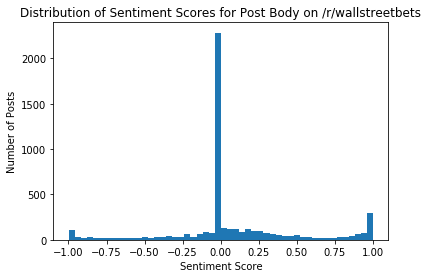

In [57]:
plt.hist(X_nonzero['mean_post_body_sentiment'].values, bins=50)
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Posts')
plt.title('Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

Text(0.5, 1.0, 'Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

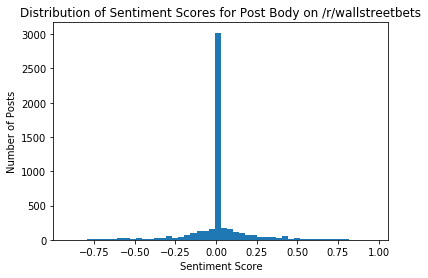

In [58]:
plt.hist(X_nonzero['mean_post_title_sentiment'].values, bins=50)
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Posts')
plt.title('Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

Text(0.5, 1.0, 'Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

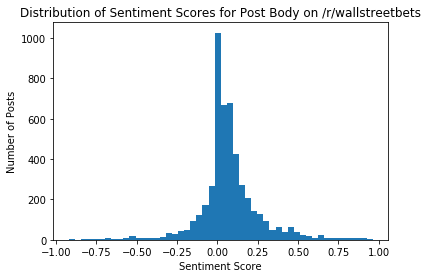

In [59]:
plt.hist(X_nonzero['mean_comments_sentiment'].values, bins=50)
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Posts')
plt.title('Distribution of Sentiment Scores for Post Body on /r/wallstreetbets')

In [137]:
# Filter out entries with sentiment scores >=0.05 or <=0.05

mask = abs(X_nonzero['mean_post_body_sentiment']) >= 0.05
X_nonzero_2 = X_nonzero[mask]
Y_nonzero_2 = Y_nonzero[mask]

In [130]:
X_nonzero.shape

(4964, 9)

In [112]:
X_nonzero_2.shape

(2507, 9)

***

# Including all sentiment scores

In [87]:
Xt, Xv, yt, yv = train_test_split(X_nonzero, Y_nonzero, test_size=0.2)

# OLS

In [88]:
def print_accuracy(f):
    print("Root mean squared test error = {0}".format(np.sqrt(np.mean((f(Xt) - yt)**2))))
    time.sleep(0.5) # to let the print get out before any progress bars

In [89]:
Xt_summary = shap.kmeans(Xt, 10)

In [90]:
lin_reg = linear_model.LinearRegression()
lin_reg.fit(Xt, yt)

print_accuracy(lin_reg.predict)

Root mean squared test error = 157951.91889269714


In [91]:
ex = shap.KernelExplainer(lin_reg.predict, Xt_summary)
shap_values = ex.shap_values(Xt.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, Xt.iloc[0,:])

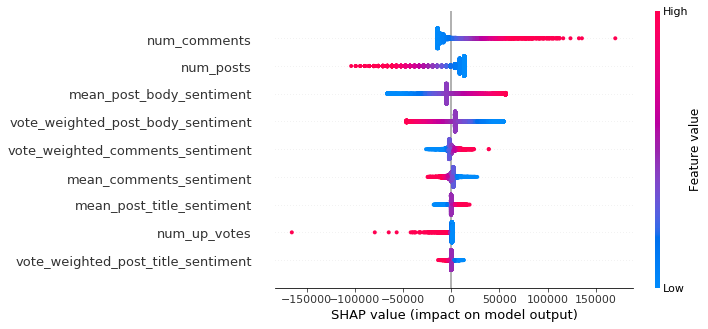

In [92]:
shap_values = ex.shap_values(Xt)
shap.summary_plot(shap_values, Xt)

In [93]:
shap_values.shape, Xv.shape

((3971, 9), (993, 9))

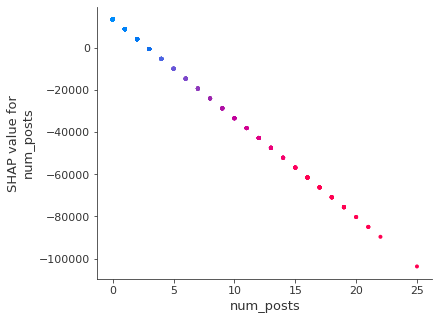

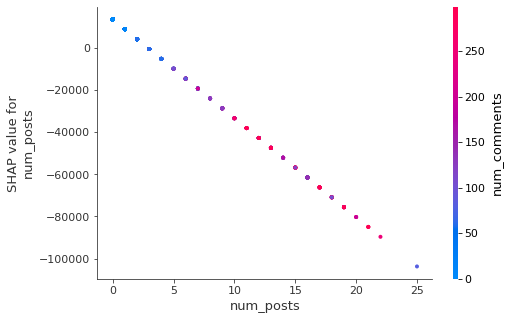

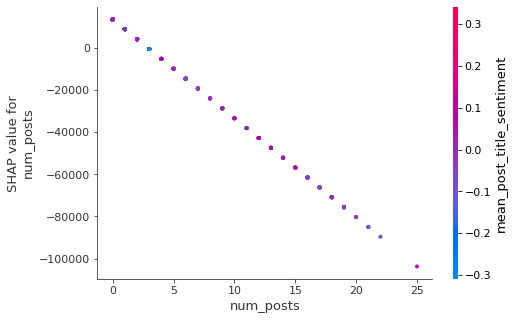

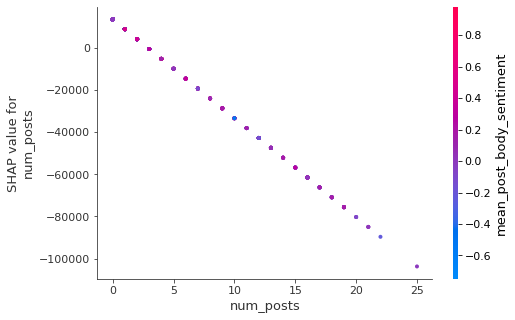

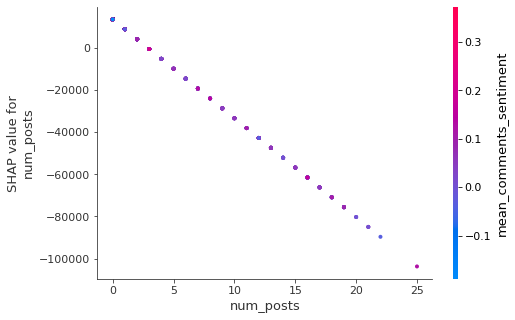

...

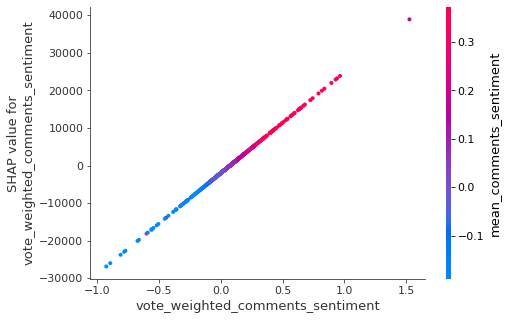

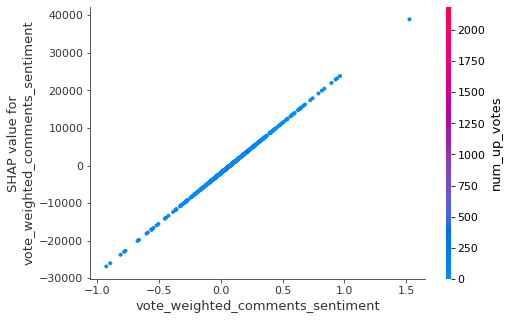

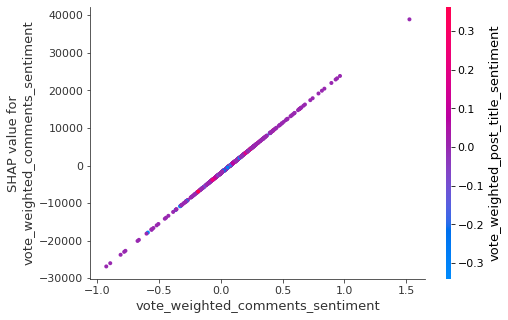

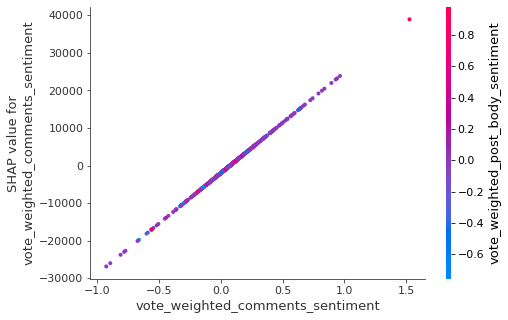

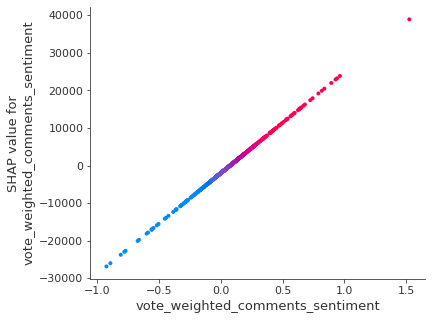

In [94]:
shap_values = ex.shap_values(Xv)
for x in X.columns:
    for y in X.columns:
        shap.dependence_plot(x, shap_values, Xv, interaction_index=y)

In [138]:
X_nonzero_c = sm.add_constant(X_nonzero)
model = sm.OLS(Y_nonzero, X_nonzero_c) # fitting OLS
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:          users_holding   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     4.851
Date:                Fri, 09 Oct 2020   Prob (F-statistic):           1.74e-06
Time:                        11:52:39   Log-Likelihood:                -66544.
No. Observations:                4964   AIC:                         1.331e+05
Df Residuals:                    4954   BIC:                         1.332e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

***

# XGBoost and SHAP

In [95]:
dt = xgb.DMatrix(Xt, label=yt.values)
dv = xgb.DMatrix(Xv, label=yv.values)

In [96]:
params = {
    "eta": .3,
    "max_depth": 10,
    "objective": "reg:squarederror",
    "silent": 1,
    "base_score": np.mean(yt),
    "eval_metric": "logloss"
}
model = xgb.train(params, dt, 3, [(dt, "train"),(dv, "valid")], early_stopping_rounds=5, verbose_eval=25)

[0]	train-logloss:-6.02482e+06	valid-logloss:-6.23931e+06
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 5 rounds.
[2]	train-logloss:-6.02482e+06	valid-logloss:-6.23931e+06


In [97]:
# compute the SHAP values for every prediction in the validation dataset
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(Xv)

In [98]:
shap.force_plot(explainer.expected_value, shap_values[0,:], Xv.iloc[0,:])

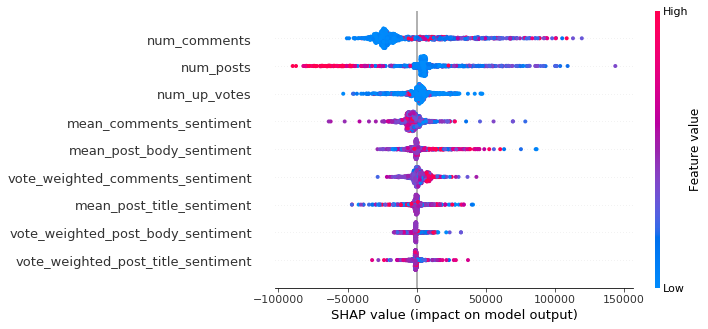

In [99]:
shap.summary_plot(shap_values, Xv)

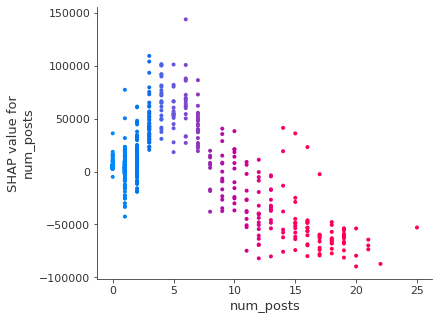

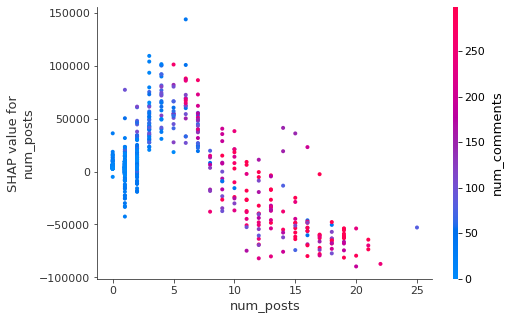

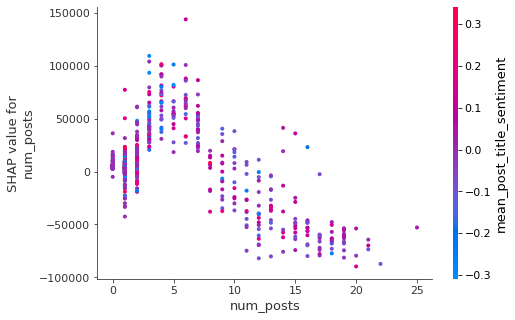

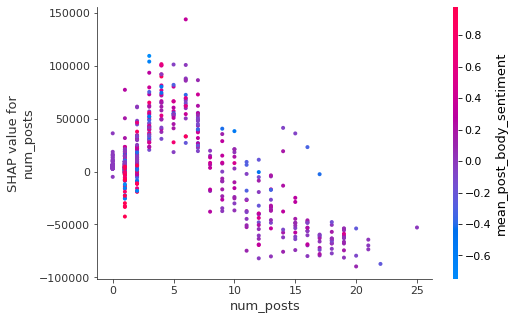

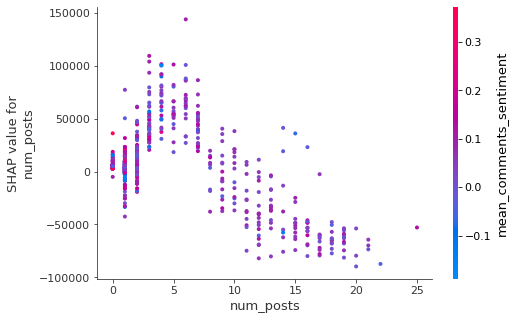

...

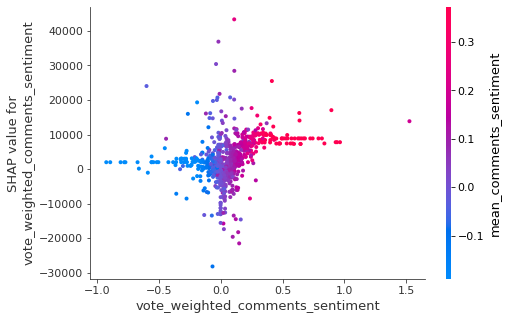

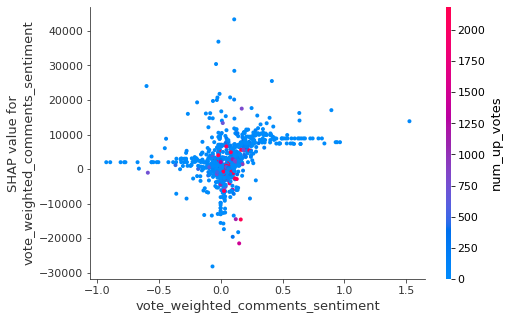

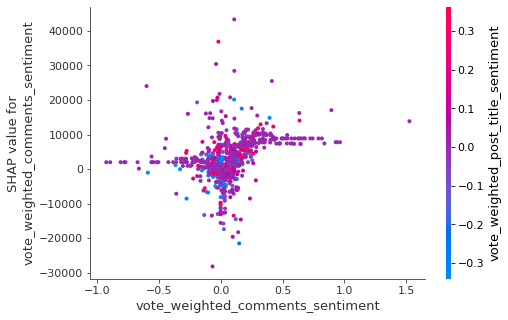

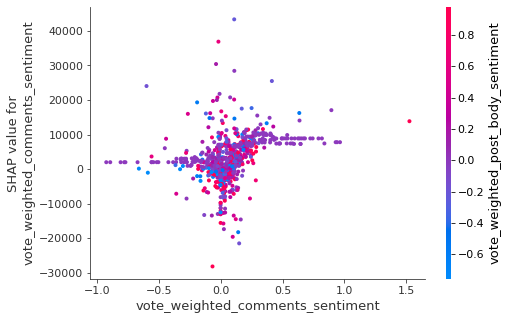

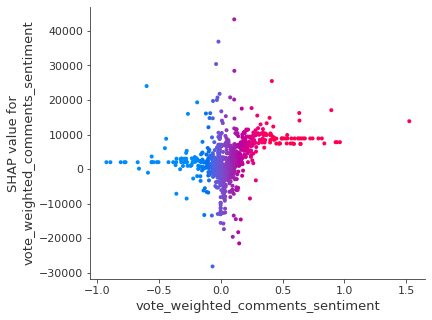

In [100]:
for x in X.columns:
    for y in X.columns:
        shap.dependence_plot(x, shap_values, Xv, interaction_index=y)

***

# Make data - excluded post body sentiment scores, s,  for which abs(s) <=0.05

In [72]:
Xt, Xv, yt, yv = train_test_split(X_nonzero_2, Y_nonzero_2, test_size=0.2)

# OLS

In [73]:
def print_accuracy(f):
    print("Root mean squared test error = {0}".format(np.sqrt(np.mean((f(Xt) - yt)**2))))
    time.sleep(0.5) # to let the print get out before any progress bars

In [74]:
Xt_summary = shap.kmeans(Xt, 10)

In [75]:
lin_reg = linear_model.LinearRegression()
lin_reg.fit(Xt, yt)

print_accuracy(lin_reg.predict)

Root mean squared test error = 184803.69170969498


In [76]:
ex = shap.KernelExplainer(lin_reg.predict, Xt_summary)
shap_values = ex.shap_values(Xt.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, Xt.iloc[0,:])

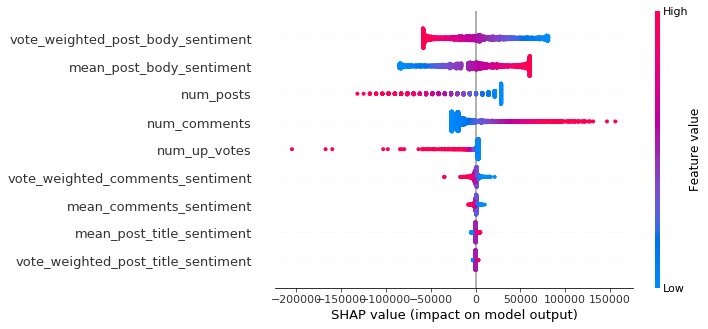

In [77]:
shap_values = ex.shap_values(Xt)
shap.summary_plot(shap_values, Xt)

In [78]:
shap_values.shape, Xv.shape

((2005, 9), (502, 9))

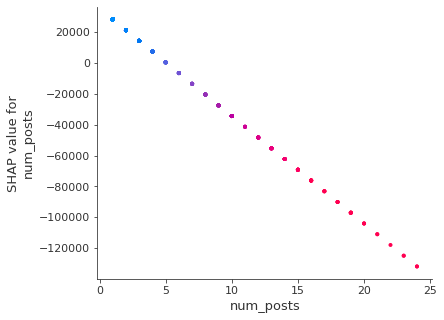

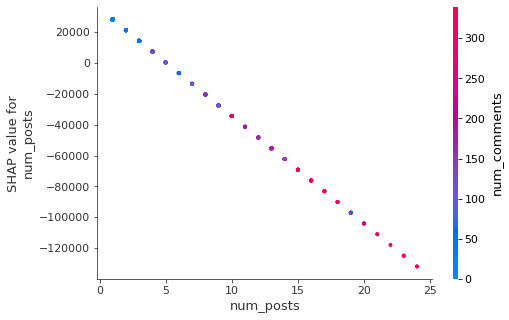

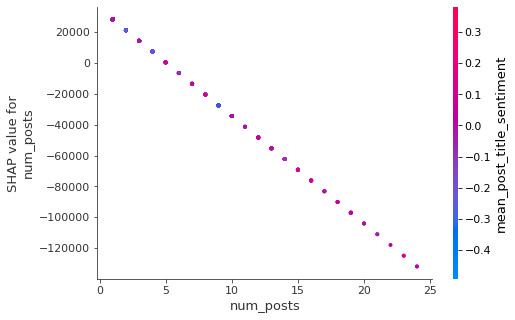

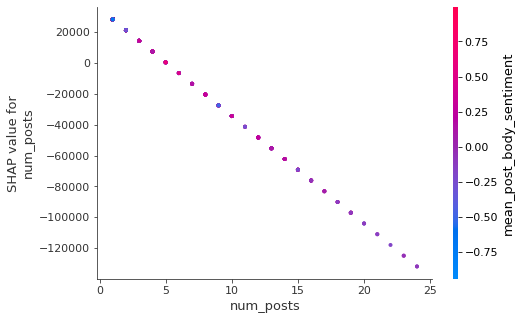

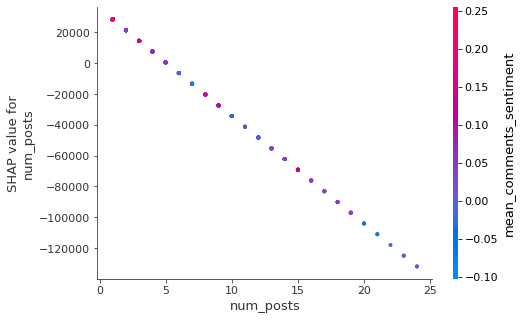

...

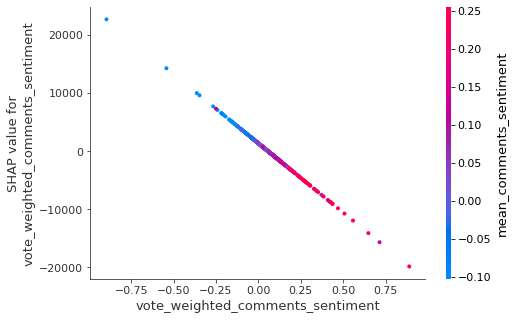

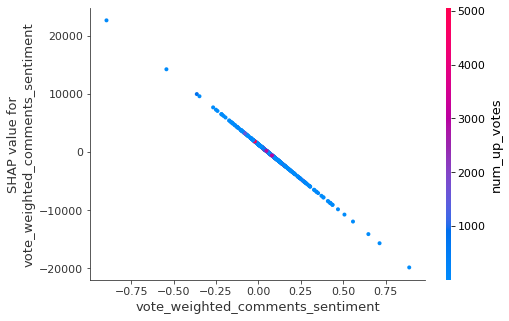

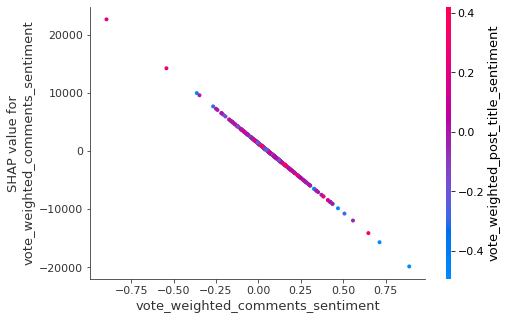

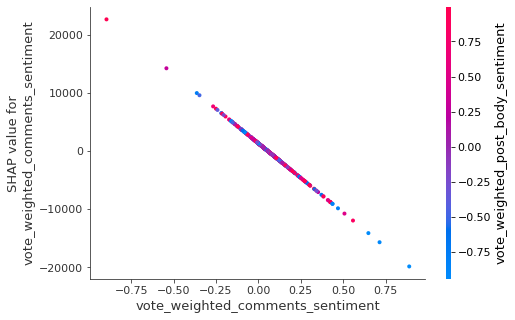

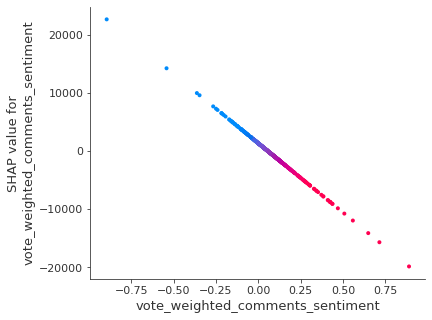

In [79]:
shap_values = ex.shap_values(Xv)
for x in X.columns:
    for y in X.columns:
        shap.dependence_plot(x, shap_values, Xv, interaction_index=y)

In [143]:
X_nonzero_2_c = sm.add_constant(X_nonzero_2)
model = sm.OLS(Y_nonzero_2, X_nonzero_2_c) # fitting OLS
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:          users_holding   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     4.663
Date:                Fri, 09 Oct 2020   Prob (F-statistic):           3.77e-06
Time:                        12:16:27   Log-Likelihood:                -33979.
No. Observations:                2507   AIC:                         6.798e+04
Df Residuals:                    2497   BIC:                         6.804e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [142]:
Y_nonzero

bin_label
2019-08-16    162989.478261
2019-08-17    163109.000000
2019-08-18    163109.000000
2019-08-19    163027.416667
2019-08-20    162695.583333
                  ...      
2020-04-29    172119.000000
2020-07-20    216699.116667
2020-07-21    217492.000000
2020-07-22    218087.666667
2020-08-01    218522.416667
Name: users_holding, Length: 4964, dtype: float64

***

# XGBoost and SHAP

In [80]:
dt = xgb.DMatrix(Xt, label=yt.values)
dv = xgb.DMatrix(Xv, label=yv.values)

In [81]:
params = {
    "eta": .3,
    "max_depth": 10,
    "objective": "reg:squarederror",
    "silent": 1,
    "base_score": np.mean(yt),
    "eval_metric": "logloss"
}
model = xgb.train(params, dt, 3, [(dt, "train"),(dv, "valid")], early_stopping_rounds=5, verbose_eval=25)

[0]	train-logloss:-6.72959e+06	valid-logloss:-6.89198e+06
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 5 rounds.
[2]	train-logloss:-6.72959e+06	valid-logloss:-6.89198e+06


In [82]:
# compute the SHAP values for every prediction in the validation dataset
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(Xv)

In [83]:
shap.force_plot(explainer.expected_value, shap_values[0,:], Xv.iloc[0,:])

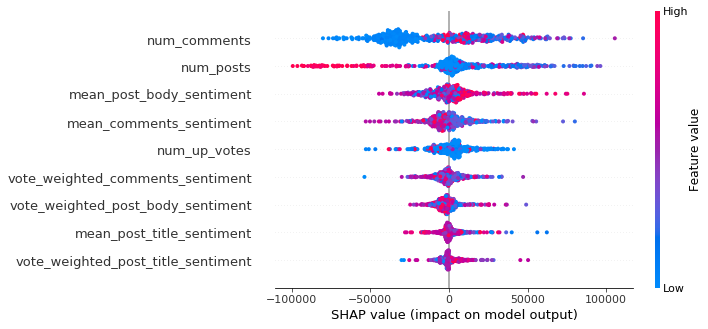

In [84]:
shap.summary_plot(shap_values, Xv)

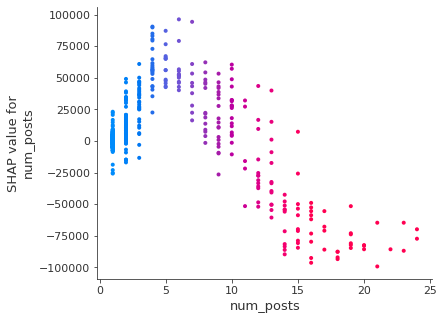

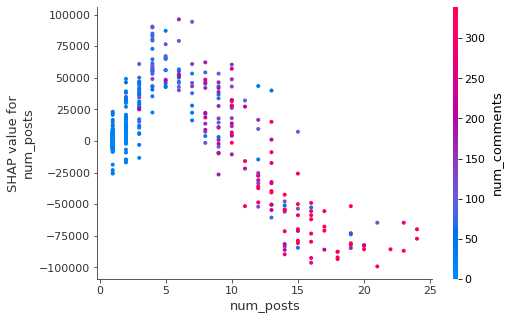

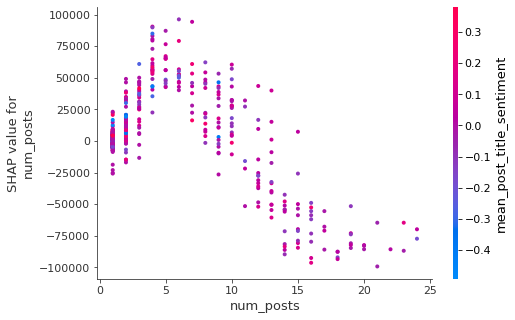

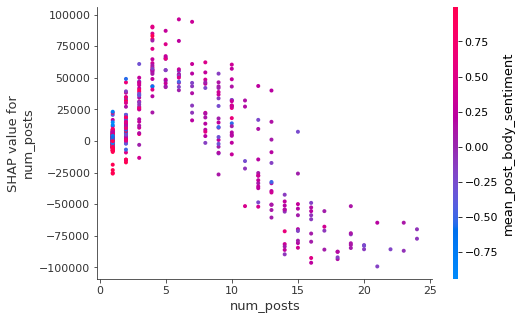

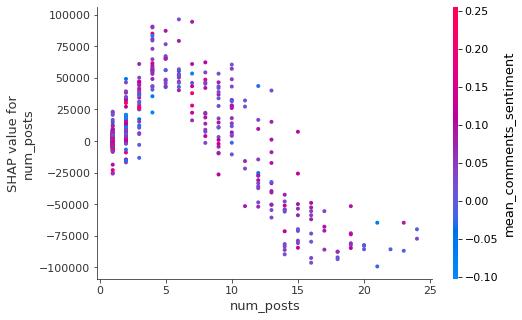

...

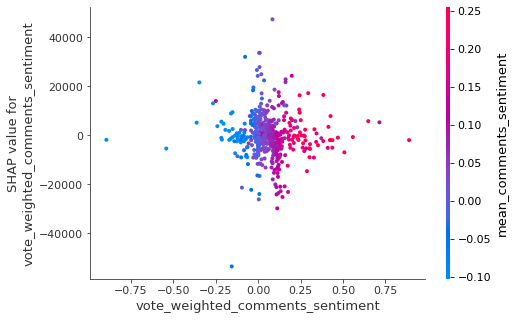

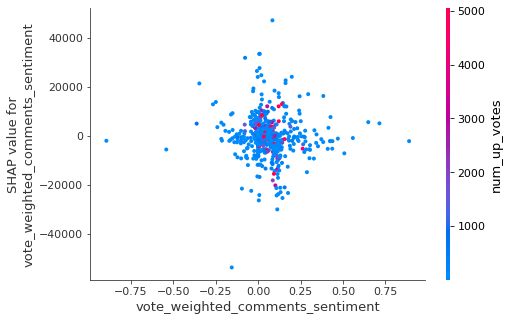

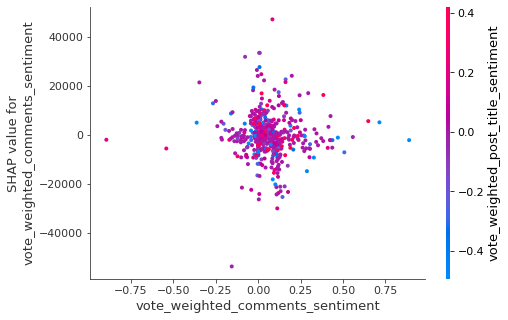

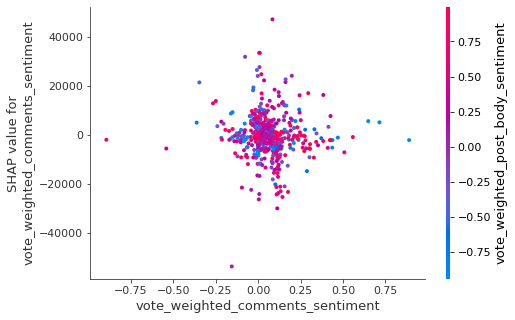

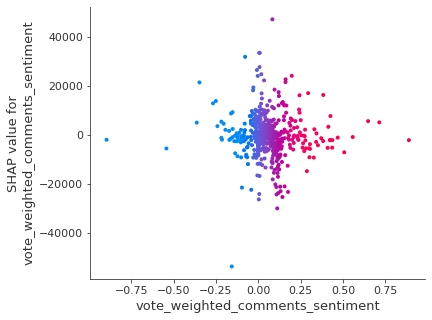

In [85]:
for x in X.columns:
    for y in X.columns:
        shap.dependence_plot(x, shap_values, Xv, interaction_index=y)

#### Load Tesla stock price data

In [105]:
max(X['num_comments'])

715.0

In [107]:
25*25

625

***

#### Plot stock price and stock popularity

#### Measure Pearson correlation

https://towardsdatascience.com/four-ways-to-quantify-synchrony-between-time-series-data-b99136c4a9c9